# Homografia boiska piłkarskiego — krok po kroku

Pipeline klasyczny (bez sieci neuronowych). Wszystko automatyczne.

**Etapy:**
1. Auto-wybór najlepszej klatki
2. Segmentacja murawy (HSV)
3. Ekstrakcja białych pikseli
4. Filtrowanie komponentów → maska linii
5. Detekcja odcinków (HoughLinesP)
6. Filtr wsparcia na masce
7. Grupowanie kątowe (2 rodziny kierunków)
8. Scalanie kolinearnych odcinków
9. Punkty zbiegu (Vanishing Points)
10. Estymacja H (VP-RANSAC) + auto-retry
11. Refinement (Nelder-Mead)
12. Walidacja + overlay
13. Rzut top-down (warpPerspective)
14. Batch na wszystkich klatkach

In [154]:
from pathlib import Path
import math, warnings

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from sklearn.cluster import KMeans

from classical_homography_v2 import ClassicalHomographyV2, PITCH_LENGTH_M, PITCH_WIDTH_M

ROOT = Path('.')
IMAGE_PATHS = sorted(ROOT.glob('*.jpg'))
print('Dostępne klatki:', [p.name for p in IMAGE_PATHS])

# ─── Helper do wyświetlania ──────────────────────────────────────────
def show(img, title='', figsize=(14, 7)):
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 else img
    plt.figure(figsize=figsize)
    plt.imshow(rgb, cmap='gray' if len(img.shape) == 2 else None)
    plt.title(title, fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def grid(imgs, titles, cols=3, figsize=(18, 5)):
    rows = math.ceil(len(imgs) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).flatten()
    for ax, im, t in zip(axes, imgs, titles):
        rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB) if len(im.shape) == 3 else im
        ax.imshow(rgb, cmap='gray' if len(im.shape) == 2 else None)
        ax.set_title(t, fontsize=10)
        ax.axis('off')
    for ax in axes[len(imgs):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def overlay_mask(img, mask, color=(0, 180, 0), alpha=0.4):
    vis = img.copy()
    c = np.zeros_like(vis)
    c[:] = color
    vis[mask > 0] = cv2.addWeighted(vis, 1 - alpha, c, alpha, 0)[mask > 0]
    return vis

Dostępne klatki: ['000001.jpg', '000066.jpg', '000069.jpg', '000250.jpg', '000300.jpg', '00031.jpg', '000310.jpg', '000374.jpg', '000545.jpg', '000726.jpg']


## Krok 0 — Wybór klatki

Zmień `MANUAL_FRAME` w komórce poniżej:

```python
MANUAL_FRAME = None          # auto-wybór najlepszej klatki
MANUAL_FRAME = '000300.jpg'  # ręczny wybór — wpisz nazwę pliku
```

Dostępne pliki: `000001.jpg` · `000250.jpg` · `000300.jpg` · `000310.jpg` · `000374.jpg`

Wybrana recznie: 000066.jpg  (1920x1080 px)


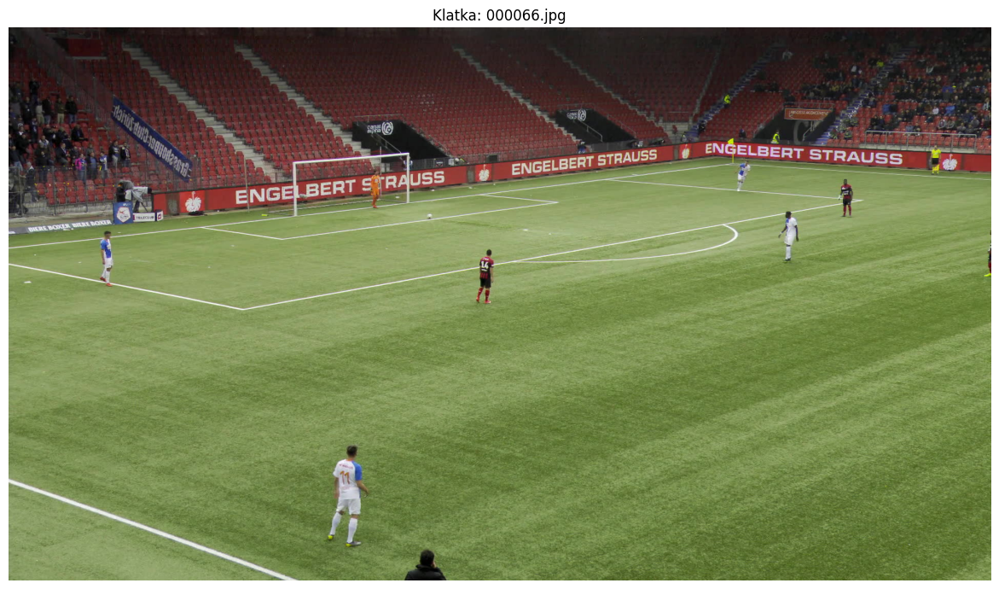

In [110]:
# ─── Ręczny wybór klatki ─────────────────────────────────────────────
# Ustaw na None żeby użyć auto-wyboru, albo podaj nazwę pliku, np. '000300.jpg'
# Dostępne: 000001.jpg  000250.jpg  000300.jpg  000310.jpg  000374.jpg
MANUAL_FRAME = '000066.jpg'

# ─────────────────────────────────────────────────────────────────────
if MANUAL_FRAME is not None:
    SELECTED = ROOT / MANUAL_FRAME
    if not SELECTED.exists():
        raise FileNotFoundError(f'Nie znaleziono: {SELECTED}')
    img = cv2.imread(str(SELECTED))
    h, w = img.shape[:2]
    print(f'Wybrana recznie: {SELECTED.name}  ({w}x{h} px)')
    show(img, f'Klatka: {SELECTED.name}')

else:
    def frame_score(path):
        img_ = cv2.imread(str(path))
        if img_ is None:
            return 0.0
        h_, w_ = img_.shape[:2]
        hsv_ = cv2.cvtColor(img_, cv2.COLOR_BGR2HSV)
        green_ = cv2.inRange(hsv_, (30, 25, 25), (95, 255, 255))
        k7 = np.ones((7, 7), np.uint8)
        green_ = cv2.morphologyEx(green_, cv2.MORPH_CLOSE, k7, iterations=3)
        cnts, _ = cv2.findContours(green_, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not cnts:
            return 0.0
        largest = max(cnts, key=cv2.contourArea)
        field_r = cv2.contourArea(largest) / (h_ * w_)
        hull_ = cv2.convexHull(largest)
        fm = np.zeros((h_, w_), np.uint8)
        cv2.fillPoly(fm, [hull_], 255)
        white_ = cv2.inRange(hsv_, (0, 0, 150), (180, 65, 255))
        line_px = int(np.sum(cv2.bitwise_and(white_, fm) > 0))
        return field_r * math.log1p(line_px)

    scores = {p: frame_score(p) for p in IMAGE_PATHS}
    print('Wyniki auto-skanowania:')
    for p, s in sorted(scores.items(), key=lambda x: -x[1]):
        marker = '  <- WYBRANY' if s == max(scores.values()) else ''
        print(f'  {p.name}: {s:.4f}{marker}')

    SELECTED = max(scores, key=scores.get)
    img = cv2.imread(str(SELECTED))
    h, w = img.shape[:2]
    print(f'\nWybrana automatycznie: {SELECTED.name}  ({w}x{h} px)')
    show(img, f'Klatka: {SELECTED.name}')

## Krok 1 — Segmentacja murawy (HSV)

**Zakres zieleni:** H∈[30, 95], S≥25, V≥25.

**Problem z convex hull:** Hull wypełnia trójkątne obszary ponad daleką linią autową —
tam gdzie w kadrze widoczne są bandy reklamowe. Dla `000250.jpg` 41 K białych pikseli
z band trafiało do maski (tyle co linie boiska).

**Rozwiązanie — flood fill od krawędzi:**
1. Umiarkowane zamknięcie (`k15`) uszczelnia granicę murawy od graczy.
2. Flood fill od narożnika `(0,0)` zaznacza wszystko poza murawą podłączone
   do brzegu obrazu jako „zewnętrze" — bandy są podłączone do brzegu → wykluczone.
3. Pozostałe dziury wewnątrz (gracze, piłka) wypełniamy.
4. Mała erozja (~10 px) czysci krawędź.

Pokrycie pola: 69.6%


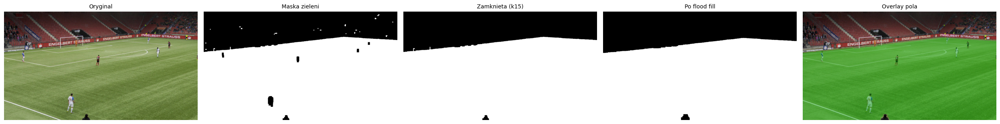

In [ ]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# ── Maska zieleni ────────────────────────────────────────────────────
green_raw = cv2.inRange(hsv, (30, 25, 25), (90, 255, 255))
k7 = np.ones((7, 7), np.uint8)
green = cv2.morphologyEx(green_raw, cv2.MORPH_OPEN,  k7, iterations=1)
green = cv2.morphologyEx(green,     cv2.MORPH_CLOSE, k7, iterations=3)

# ── Uszczelnij granicę murawy umiarkowanym zamknięciem (~7px) ────────
# Nie rozszerza się na bandy (dalej niż 7px od trawy), ale zamyka przerwy
k15 = np.ones((15,15), np.uint8)
green_closed = cv2.morphologyEx(green, cv2.MORPH_CLOSE, k15, iterations=1)

# ── Flood fill od krawędzi obrazu ────────────────────────────────────
# Bandy są podłączone do brzegu kadru → zostaną oznaczone jako "zewnętrze"
# Dziury od graczy (wewnątrz murawy) → NIE są podłączone do brzegu → zostają
inv    = cv2.bitwise_not(green_closed)
padded = cv2.copyMakeBorder(inv, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=255)
cv2.floodFill(padded, None, (0, 0), 0)      # (0,0) = lewy górny narożnik paddingu
internal_holes = padded[1:-1, 1:-1]         # 255 = wewnętrzne dziury (gracze)

# ── Połącz murawę z wypełnionymi dziurami ────────────────────────────
field_pre = cv2.bitwise_or(green_closed, internal_holes)

# ── Zachowaj tylko największy komponent (odrzuć szum tła) ────────────
n_cc2, labels_gc, stats_gc, _ = cv2.connectedComponentsWithStats(field_pre)
if n_cc2 > 1:
    best_cc = int(np.argmax(stats_gc[1:, cv2.CC_STAT_AREA])) + 1
    field_pre = (labels_gc == best_cc).astype(np.uint8) * 255

# ── Mała erozja (~10 px) odcina krawędź ─────────────────────────────
k11 = np.ones((11, 11), np.uint8)
field_mask = cv2.erode(field_pre, k11, iterations=2)

area_ratio = float(np.sum(field_mask > 0)) / (h * w)
print(f'Pokrycie pola: {area_ratio:.1%}')

grid(
    [img, green, field_pre, field_mask, overlay_mask(img, field_mask)],
    ['Oryginal', 'Maska zieleni', 'Zamknieta (k15)', 'Po flood fill', 'Overlay pola'],
    cols=5, figsize=(25, 5)
)

## Krok 2 — Ekstrakcja białych pikseli

**Zakres bieli:** S∈[0, 65], V∈[150, 255].
Ograniczamy do maski pola, żeby odciąć bandy i napisy poza boiskiem.
Morfologia open+close usuwa izolowane piksele szumu.

In [ ]:
white_raw   = cv2.inRange(hsv, (0, 0, 90), (180, 60, 255))
white_field = cv2.bitwise_and(white_raw, field_mask)

k3 = np.ones((3, 3), np.uint8)
white_clean = cv2.morphologyEx(white_field, cv2.MORPH_OPEN,  k3, iterations=3)
white_clean = cv2.morphologyEx(white_clean, cv2.MORPH_CLOSE, k3, iterations=3)

print(f'Białe piksele raw:              {np.sum(white_raw   > 0):>8,}')
print(f'Białe w polu:                   {np.sum(white_field > 0):>8,}')
print(f'Białe po morfologii (white_clean): {np.sum(white_clean > 0):>8,}')

grid(
    [white_raw, white_field, white_clean,
     overlay_mask(img, white_clean, color=(0, 180, 255))],
    ['Biel raw', 'Biel w polu', 'Biel po morfologii', 'Overlay bieli'], cols=4, figsize=(22, 5)
)

error: OpenCV(4.13.0) :-1: error: (-5:Bad argument) in function 'morphologyEx'
> Overload resolution failed:
>  - morphologyEx() missing required argument 'kernel' (pos 3)
>  - morphologyEx() missing required argument 'kernel' (pos 3)


## Krok 3 — Filtrowanie komponentów → maska linii

Linie boiska mają charakterystyczny kształt: cienkie i wydłużone.
Odrzucamy komponenty które są:
- za małe (< 15 px)
- za duże (> 2% obrazu) — zawodnicy, obszary
- "blob-y": niski aspect ratio (< 2.2) **i** grube (thin_dim > 18 px)
- mocno wypełnione (fill > 0.75) i duże — prostokątne plamy

**Zielone** = zachowane (kandydaci linii), **czerwone** = odrzucone.

Komponentów łącznie:  176
  Zachowanych:        116   (zielone)
  Odrzuconych:        60   (czerwone)
Piksele linii (line_mask): 18,305


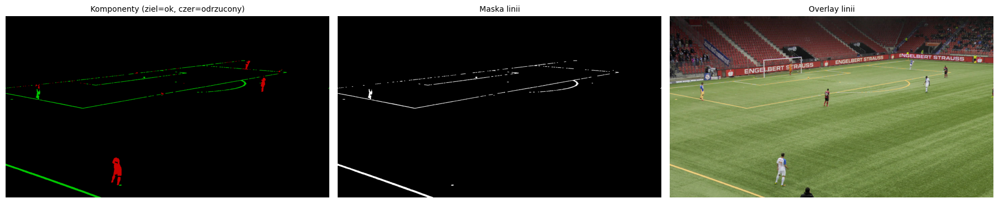

In [213]:
n_lab, labels_cc, stats_cc, _ = cv2.connectedComponentsWithStats(white_clean, connectivity=8)
max_area_comp = int(0.02 * h * w)

line_mask  = np.zeros((h, w), np.uint8)
vis_comp   = np.zeros((h, w, 3), np.uint8)
kept_n, rejected_n = 0, 0
comp_info = []

for i in range(1, n_lab):
    area   = int(stats_cc[i, cv2.CC_STAT_AREA])
    bw     = int(stats_cc[i, cv2.CC_STAT_WIDTH])
    bh     = int(stats_cc[i, cv2.CC_STAT_HEIGHT])
    aspect = max(bw, bh) / max(min(bw, bh), 1)
    thin   = min(bw, bh)
    fill   = area / max(bw * bh, 1)

    ok = True
    if   area < 15:                    ok = False  # za mały
    elif area > max_area_comp:         ok = False  # za duży
    elif aspect < 2.2 and thin > 18:   ok = False  # blob
    elif fill > 0.75 and area > 120:   ok = False  # pełny prostokąt
    # -- Filtry odrzucające zawodników --
    elif bh > (bw * 1.2) and thin > 6 and area > 30: ok = False  # Klasyczny stojący zawodnik (pionowy)
    elif aspect < 2.5 and thin > 5 and area > 30: ok = False  # "Kwadratowy", grubszy blob (zawodnik w biegu / w rozkroku)

    comp_info.append({'area': area, 'aspect': round(aspect, 1), 'thin': thin,
                      'fill': round(fill, 2), 'keep': ok})
    if ok:
        line_mask[labels_cc == i] = 255
        vis_comp[labels_cc == i]  = (0, 200, 0)
        kept_n += 1
    else:
        vis_comp[labels_cc == i]  = (0, 0, 200)
        rejected_n += 1

print(f'Komponentów łącznie:  {n_lab - 1}')
print(f'  Zachowanych:        {kept_n}   (zielone)')
print(f'  Odrzuconych:        {rejected_n}   (czerwone)')
print(f'Piksele linii (line_mask): {np.sum(line_mask > 0):,}')

grid(
    [vis_comp, line_mask, overlay_mask(img, line_mask, color=(0, 180, 255))],
    ['Komponenty (ziel=ok, czer=odrzucony)', 'Maska linii', 'Overlay linii'],
    cols=3, figsize=(18, 6)
)

## Krok 4 — Detekcja odcinków (HoughLinesP)

Canny na masce linii daje krawędzie. HoughLinesP szuka odcinków prostych w przestrzeni Hougha.

Kluczowe parametry:
- `threshold` — min głosów w akumulatorze (niżej = więcej, ale więcej szumu)
- `minLineLength` — minimalna długość odcinka w pikselach
- `maxLineGap` — maks. przerwa między częściami tej samej linii

Krawędzie Canny:     8,245 px
Odcinki HoughLinesP: 174


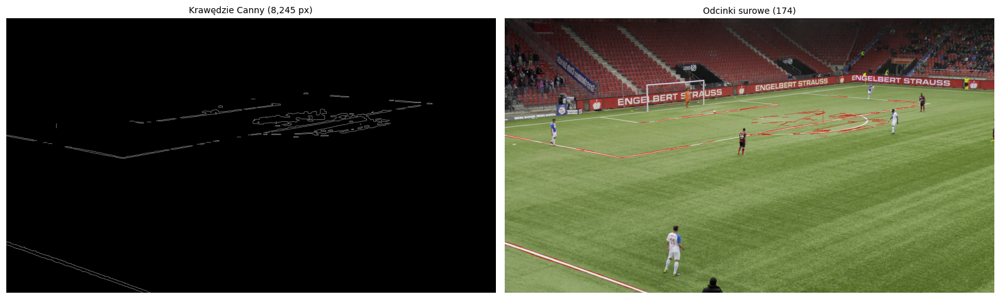

In [152]:
edges = cv2.Canny(line_mask, 50, 150)

segs_raw = cv2.HoughLinesP(
    edges,
    rho=1, theta=np.pi / 180,
    threshold=18, minLineLength=22, maxLineGap=18
)
segs_raw = segs_raw.reshape(-1, 4) if segs_raw is not None else np.empty((0, 4), np.int32)

vis_hough = img.copy()
for x1, y1, x2, y2 in segs_raw:
    cv2.line(vis_hough, (x1, y1), (x2, y2), (0, 0, 220), 1)

print(f'Krawędzie Canny:     {np.sum(edges > 0):,} px')
print(f'Odcinki HoughLinesP: {len(segs_raw)}')

grid(
    [edges, vis_hough],
    [f'Krawędzie Canny ({np.sum(edges > 0):,} px)',
     f'Odcinki surowe ({len(segs_raw)})'],
    cols=2, figsize=(16, 6)
)

## Krok 5 — Filtr wsparcia

Każdy odcinek próbkujemy co ~3 px i sprawdzamy, ile próbek trafia na białą maskę (±4 px).
Odrzucamy odcinki z < 45% wsparcia — to eliminuje przypadkowe linie z krawędzi zawodników.

Po filtrze wsparcia: 149 / 174 odcinków


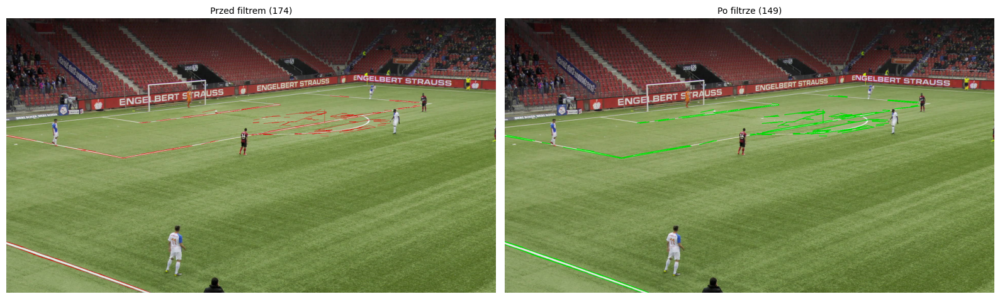

In [153]:
def support_ratio(mask, seg, radius=4):
    x1_, y1_, x2_, y2_ = [float(v) for v in seg]
    length_ = math.hypot(x2_ - x1_, y2_ - y1_)
    n = int(max(12, min(160, length_ / 3)))
    xs_ = np.linspace(x1_, x2_, n)
    ys_ = np.linspace(y1_, y2_, n)
    H_, W_ = mask.shape[:2]
    hit = 0
    for x_, y_ in zip(xs_, ys_):
        xi, yi = int(round(x_)), int(round(y_))
        x0, x1b = max(0, xi - radius), min(W_, xi + radius + 1)
        y0, y1b = max(0, yi - radius), min(H_, yi + radius + 1)
        if x0 < x1b and y0 < y1b and np.any(mask[y0:y1b, x0:x1b] > 0):
            hit += 1
    return hit / n

kept_segs = []
for seg in segs_raw:
    if math.hypot(seg[2] - seg[0], seg[3] - seg[1]) < 25:
        continue
    if support_ratio(line_mask, seg) >= 0.45:
        kept_segs.append(seg)

segments = np.array(kept_segs, dtype=np.int32) if kept_segs else np.empty((0, 4), np.int32)

vis_filt = img.copy()
for x1, y1, x2, y2 in segments:
    cv2.line(vis_filt, (x1, y1), (x2, y2), (0, 220, 0), 2)

print(f'Po filtrze wsparcia: {len(segments)} / {len(segs_raw)} odcinków')

grid(
    [vis_hough, vis_filt],
    [f'Przed filtrem ({len(segs_raw)})', f'Po filtrze ({len(segments)})'],
    cols=2, figsize=(16, 6)
)

## Krok 6 — Grupowanie kątowe (2 rodziny kierunków)

Boisko ma dwa zestawy równoległych linii — wzdłuż i w poprzek.
K-means klastruje wektory (cos 2θ, sin 2θ): mapowanie kątów [0°,180°) na okrąg → k-means działa poprawnie dla kątów.

Grupa 0 (niebieska): 33 odcinków  kąt śr=166.4°  łączna dł=1919px
Grupa 1 (żółta): 31 odcinków  kąt śr=14.6°  łączna dł=2725px


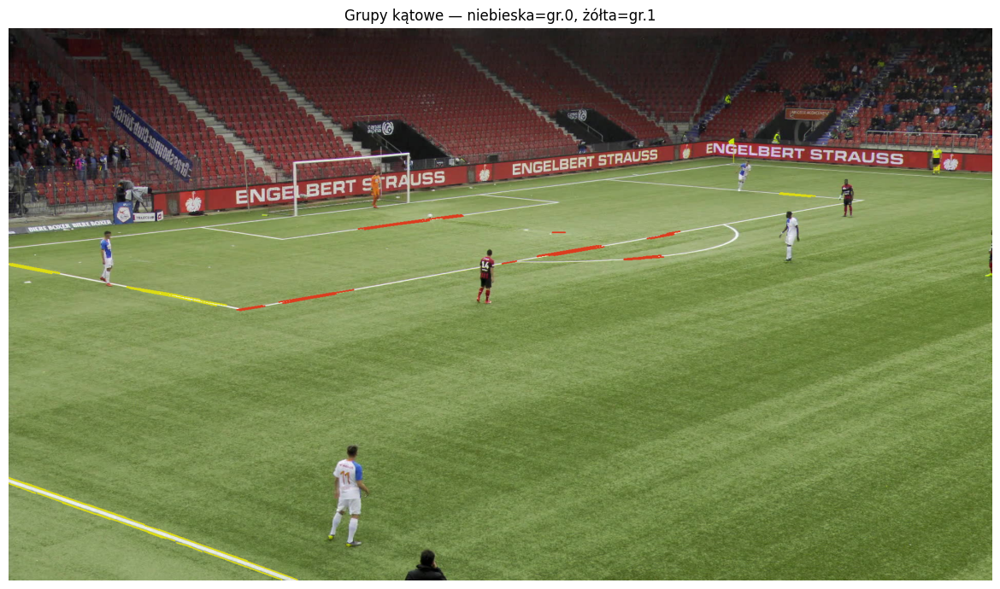

In [139]:
def seg_angle(seg):
    return math.degrees(math.atan2(seg[3] - seg[1], seg[2] - seg[0])) % 180

angles  = np.array([seg_angle(s) for s in segments], dtype=np.float64)
lengths = np.array([math.hypot(s[2]-s[0], s[3]-s[1]) for s in segments], dtype=np.float64)

if len(segments) >= 4:
    vecs = np.column_stack([np.cos(2 * np.radians(angles)),
                            np.sin(2 * np.radians(angles))])
    km = KMeans(n_clusters=2, n_init=10, random_state=10)
    labels_km = km.fit_predict(vecs, sample_weight=lengths)
else:
    labels_km = np.zeros(len(segments), dtype=int)

vis_groups = img.copy()
for seg, lab in zip(segments, labels_km):
    color = (30, 60, 220) if lab == 0 else (20, 220, 220)
    cv2.line(vis_groups, (seg[0], seg[1]), (seg[2], seg[3]), color, 2)

for g in range(2):
    mask_g = labels_km == g
    label_color = 'niebieska' if g == 0 else 'żółta'
    print(f'Grupa {g} ({label_color}): {mask_g.sum()} odcinków  '
          f'kąt śr={angles[mask_g].mean():.1f}°  '
          f'łączna dł={lengths[mask_g].sum():.0f}px')

show(vis_groups, 'Grupy kątowe — niebieska=gr.0, żółta=gr.1')

## Krok 7 — Scalanie kolinearnych odcinków

Odcinki o podobnym kącie (≤6°) i leżące blisko tej samej prostej (≤18 px) są scalane przez PCA.
Wynik to lista "pełnych linii" — każda reprezentuje jedną linię boiska.

Scalone linie: 7   gr.A=4, gr.B=3

  Linia  0: kąt=170.4°  dł=  1278px  odcinków=21
  Linia  1: kąt= 18.7°  dł=  1037px  odcinków=9
  Linia  2: kąt= 19.6°  dł=   786px  odcinków=7
  Linia  3: kąt= 10.5°  dł=   771px  odcinków=13
  Linia  4: kąt=172.4°  dł=   448px  odcinków=7
  Linia  5: kąt=176.1°  dł=   167px  odcinków=4
  Linia  6: kąt=  4.9°  dł=   129px  odcinków=2


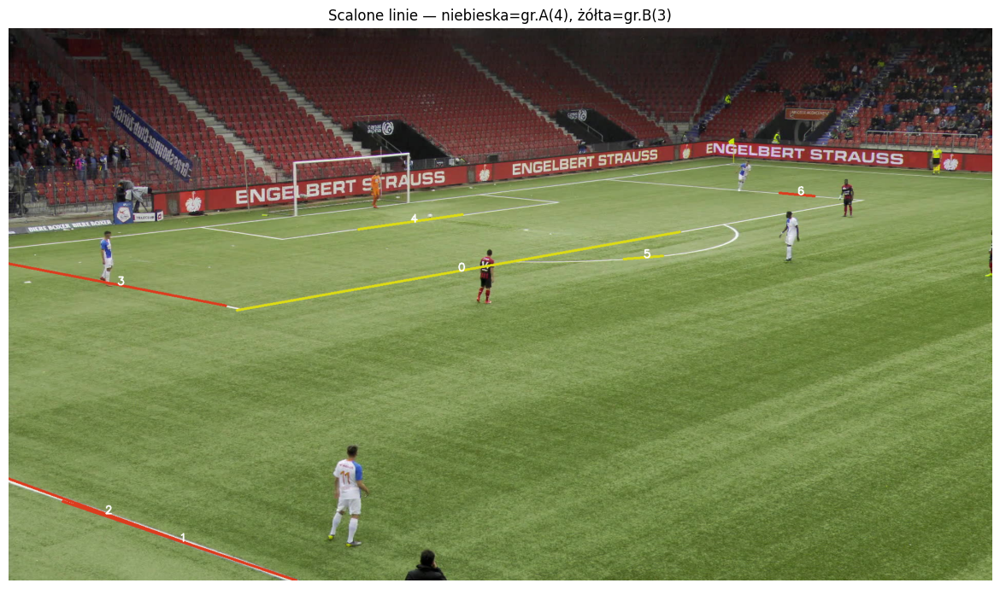

In [140]:
calibrator = ClassicalHomographyV2(w, h, ransac_iterations=5000, min_score=0.20, verbose=False)

merged = calibrator.merge_collinear(
    segments, angle_tol=6.0, dist_tol=18.0, min_total_length=45.0
)
ga, gb = calibrator.group_two_directions(merged)

print(f'Scalone linie: {len(merged)}   gr.A={len(ga)}, gr.B={len(gb)}')
print()
for i, m in enumerate(merged):
    print(f'  Linia {i:2d}: kąt={m["angle"]:5.1f}°  '
          f'dł={m["total_length"]:6.0f}px  '
          f'odcinków={m["n_segments"]}')

vis_merged = img.copy()
for m in ga:
    p1_ = tuple(m['p1'].astype(int))
    p2_ = tuple(m['p2'].astype(int))
    cv2.line(vis_merged, p1_, p2_, (30, 60, 220), 3)
for m in gb:
    p1_ = tuple(m['p1'].astype(int))
    p2_ = tuple(m['p2'].astype(int))
    cv2.line(vis_merged, p1_, p2_, (20, 220, 220), 3)
for i, m in enumerate(merged):
    mid_ = tuple(((m['p1'] + m['p2']) / 2).astype(int))
    cv2.putText(vis_merged, str(i), mid_,
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

show(vis_merged, f'Scalone linie — niebieska=gr.A({len(ga)}), żółta=gr.B({len(gb)})')

## Krok 8 — Punkty zbiegu (Vanishing Points)

Równoległe linie boiska (w perspektywie) zbiegają się w jednym punkcie.
VP każdej rodziny wyznaczamy z przecięcia linii jednorodnych (SVD gdy >2 linii).

**Zielone kółka** = przecięcia linii gr.A × gr.B (kandydaci korespondencji do RANSAC).

VP gr.A = (np.float64(-2825.956527640256), np.float64(-84.03816681291615))  (poza kadrem)
VP gr.B = (np.float64(3556.775411741362), np.float64(1.6020222870491445))  (poza kadrem)
Przecięcia linii (kandydaci): 12


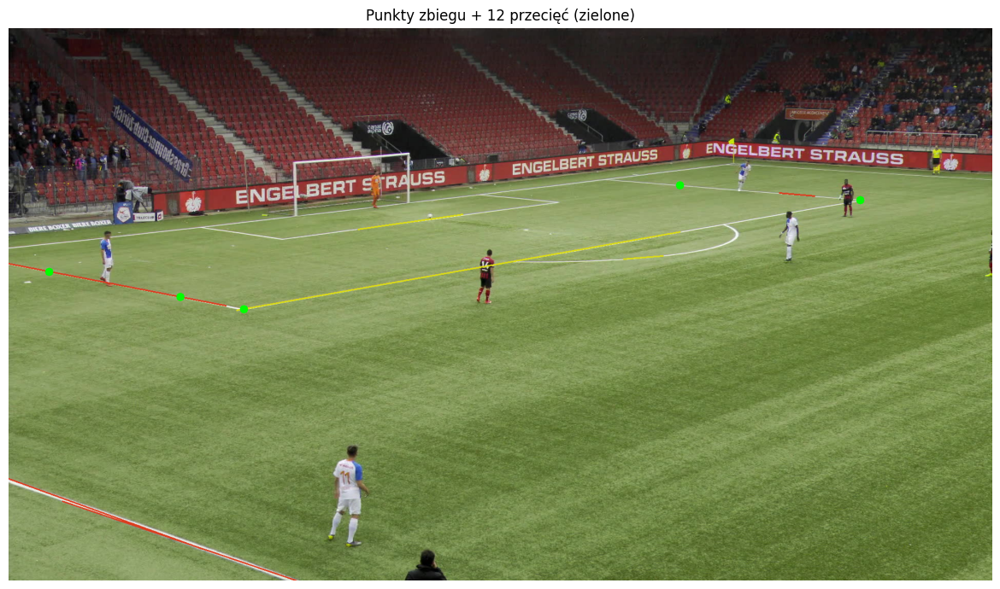

In [141]:
def norm_vp(vp_h):
    if vp_h is None or abs(vp_h[2]) < 1e-10:
        return None
    return (vp_h[0] / vp_h[2], vp_h[1] / vp_h[2])

vp_a_h = calibrator.compute_vanishing_point(ga) if len(ga) >= 2 else None
vp_b_h = calibrator.compute_vanishing_point(gb) if len(gb) >= 2 else None

vpa = norm_vp(vp_a_h)
vpb = norm_vp(vp_b_h)

print(f'VP gr.A = {vpa}  ({"w kadrze" if vpa and 0<=vpa[0]<w and 0<=vpa[1]<h else "poza kadrem"})' if vpa else 'VP gr.A: brak (< 2 linie)')
print(f'VP gr.B = {vpb}  ({"w kadrze" if vpb and 0<=vpb[0]<w and 0<=vpb[1]<h else "poza kadrem"})' if vpb else 'VP gr.B: brak (< 2 linie)')

intersections = (calibrator.detect_intersections(ga, gb)
                 if len(ga) >= 1 and len(gb) >= 1
                 else np.empty((0, 2)))
print(f'Przecięcia linii (kandydaci): {len(intersections)}')

vis_vp = img.copy()
for m in ga:
    cv2.line(vis_vp, tuple(m['p1'].astype(int)), tuple(m['p2'].astype(int)), (30, 60, 220), 2)
for m in gb:
    cv2.line(vis_vp, tuple(m['p1'].astype(int)), tuple(m['p2'].astype(int)), (20, 220, 220), 2)
for vp_, col_ in [(vpa, (30, 60, 220)), (vpb, (20, 220, 220))]:
    if vp_ is not None:
        x_, y_ = int(round(vp_[0])), int(round(vp_[1]))
        if -200 <= x_ <= w + 200 and -200 <= y_ <= h + 200:
            cv2.circle(vis_vp, (max(0, min(w-1, x_)), max(0, min(h-1, y_))), 14, col_, -1)
for pt in intersections:
    xi, yi = int(round(pt[0])), int(round(pt[1]))
    if 0 <= xi < w and 0 <= yi < h:
        cv2.circle(vis_vp, (xi, yi), 8, (0, 255, 0), -1)

show(vis_vp, f'Punkty zbiegu + {len(intersections)} przecięć (zielone)')

## Krok 9 — Estymacja H (VP-RANSAC) + auto-retry

**Algorytm:**
1. Oblicza VP dla każdej rodziny linii.
2. Losuje 2 punkty korespondencji (przecięcia + narożniki Shi-Tomasi).
3. Z VP₁, VP₂ i 2 korespondencji wyznacza H (4 równania liniowe).
4. Ocenia H przez F1 (nakładanie modelu linii boiska na maskę).
5. Zwraca najlepszą H po N iteracjach.

Jeśli score < 0.20, automatyczny retry z rozluźnionymi parametrami.

In [142]:
print('Pass 1: domyślne parametry (RANSAC 5000 iter)...')
H, score = calibrator.estimate_homography(line_mask, ga, gb)
print(f'  score={score:.4f}  H_found={H is not None}')

if H is None or score < 0.20:
    print('\nPass 2: rozluźnione parametry (merge luźniejszy, RANSAC 10000 iter)...')
    cal2 = ClassicalHomographyV2(w, h, ransac_iterations=10000, min_score=0.15, verbose=False)
    merged2 = cal2.merge_collinear(
        segments, angle_tol=8.0, dist_tol=25.0, min_total_length=30.0
    )
    ga2, gb2 = cal2.group_two_directions(merged2)
    print(f'  Scalone(2): {len(merged2)}  gr.A={len(ga2)}  gr.B={len(gb2)}')
    H2, score2 = cal2.estimate_homography(line_mask, ga2, gb2)
    print(f'  score={score2:.4f}  H_found={H2 is not None}')
    if H2 is not None and score2 > score:
        H, score, calibrator = H2, score2, cal2
        ga, gb = ga2, gb2
        print('  → Używam parametrów z pass 2')

if H is None or score < 0.15:
    print('\nPass 3: bardzo agresywne Hough + full RANSAC...')
    edges3  = cv2.Canny(line_mask, 30, 120)
    segs3   = cv2.HoughLinesP(edges3, 1, np.pi/180, threshold=12,
                               minLineLength=15, maxLineGap=25)
    segs3   = segs3.reshape(-1, 4) if segs3 is not None else np.empty((0, 4), np.int32)
    kept3   = [s for s in segs3 if support_ratio(line_mask, s) >= 0.40]
    segs3f  = np.array(kept3, dtype=np.int32) if kept3 else np.empty((0, 4), np.int32)
    cal3    = ClassicalHomographyV2(w, h, ransac_iterations=15000, min_score=0.12, verbose=False)
    merged3 = cal3.merge_collinear(segs3f, angle_tol=10.0, dist_tol=30.0, min_total_length=20.0)
    ga3, gb3 = cal3.group_two_directions(merged3)
    print(f'  Odcinki(3): {len(segs3f)}  Scalone(3): {len(merged3)}  gr.A={len(ga3)}  gr.B={len(gb3)}')
    H3, score3 = cal3.estimate_homography(line_mask, ga3, gb3)
    print(f'  score={score3:.4f}  H_found={H3 is not None}')
    if H3 is not None and score3 > score:
        H, score, calibrator = H3, score3, cal3
        ga, gb = ga3, gb3
        print('  → Używam parametrów z pass 3')

print()
if H is not None:
    print(f'Najlepsza H znaleziona (score={score:.4f}):')
    print(np.round(H, 6))
else:
    print('Nie znaleziono H. Sprawdź kroki 1-8 — możliwy problem: zbyt mało linii w jednej grupie.')

Pass 1: domyślne parametry (RANSAC 5000 iter)...
  score=0.0000  H_found=False

Pass 2: rozluźnione parametry (merge luźniejszy, RANSAC 10000 iter)...
  Scalone(2): 8  gr.A=4  gr.B=4
  score=0.3537  H_found=True
  → Używam parametrów z pass 2

Najlepsza H znaleziona (score=0.3537):
[[ 3.07300000e-03 -3.54207000e-01  1.10702080e+02]
 [ 4.62590000e-02 -1.76903000e-01  1.17603293e+02]
 [ 5.56000000e-04 -5.96700000e-03  1.00000000e+00]]


## Krok 10 — Refinement (Nelder-Mead)

Startując od najlepszej H z RANSAC, lokalnie optymalizujemy F1 metodą Nelder-Mead.
Zwykle daje kilka punktów procentowych poprawy.

In [143]:
if H is not None:
    score_before = calibrator.score_homography(H, line_mask)
    H, score_after = calibrator.refine_homography(H, line_mask)
    print(f'F1 przed refinementem: {score_before:.4f}')
    print(f'F1 po refinemencie:    {score_after:.4f}')
    print(f'Poprawa:               {score_after - score_before:+.4f}')
else:
    print('Brak H — pomijam refinement.')

F1 przed refinementem: 0.3537
F1 po refinemencie:    0.3604
Poprawa:               +0.0067


## Krok 11 — Walidacja + overlay na oryginale

Rzutujemy model linii boiska (metry) na obraz przez H⁻¹.

**Metryki:**
- **F1** — nakładanie modelu na maskę (po dylatacji ±3px)
- **Chamfer model→maska** — śr. odległość pikseli modelu do najbliższej białej linii
- **Chamfer maska→model** — śr. odległość białych linii do modelu
- **coverage** — rozpiętość modelu w kadrze

F1 score:               0.3604   (próg ≥ 0.25)
Chamfer model→maska:     116.0 px  (próg < 14)
Chamfer maska→model:      44.0 px  (próg < 28)
Coverage:               65.4%      (próg ≥ 20%)

→ Homografia ODRZUCONA


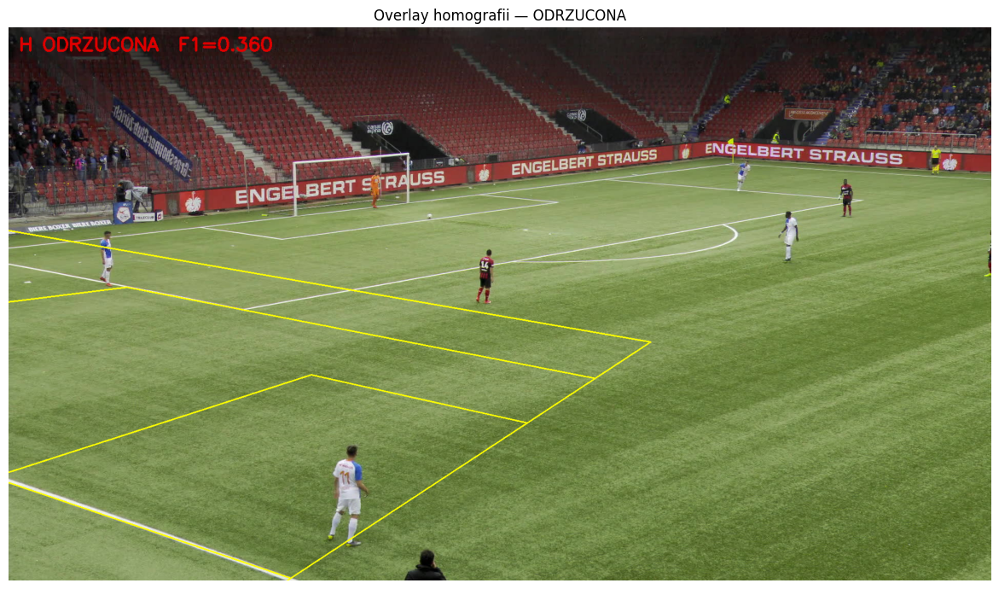

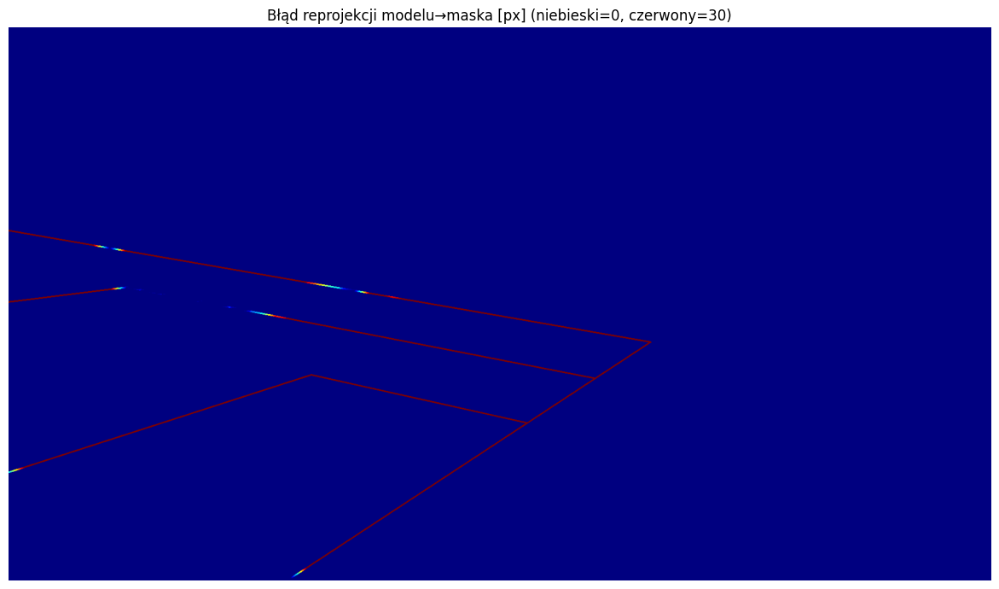

In [144]:
if H is not None:
    try:
        H_inv = np.linalg.inv(H)
    except np.linalg.LinAlgError:
        H_inv = None

    # Budujemy maskę modelu na obrazie
    model_mask = np.zeros((h, w), np.uint8)
    if H_inv is not None:
        for polyline in calibrator.pitch_lines:
            pts_ = []
            for xm, ym in polyline:
                p_ = H_inv @ np.array([float(xm), float(ym), 1.0])
                if abs(p_[2]) < 1e-10:
                    continue
                p_ /= p_[2]
                pts_.append((int(round(p_[0])), int(round(p_[1]))))
            for k in range(len(pts_) - 1):
                cv2.line(model_mask, pts_[k], pts_[k + 1], 255, 2)

    # Chamfer distances
    line_bin  = (line_mask  > 0).astype(np.uint8)
    model_bin = (model_mask > 0).astype(np.uint8)
    d2line  = cv2.distanceTransform((1 - line_bin ).astype(np.uint8), cv2.DIST_L2, 3)
    d2model = cv2.distanceTransform((1 - model_bin).astype(np.uint8), cv2.DIST_L2, 3)
    m2l = float(np.mean(d2line [model_bin > 0])) if np.any(model_bin > 0) else 9999.0
    l2m = float(np.mean(d2model[line_bin  > 0])) if np.any(line_bin  > 0) else 9999.0

    ys_, xs_ = np.where(model_bin > 0)
    coverage = max((xs_.max() - xs_.min()) / w,
                   (ys_.max() - ys_.min()) / h) if len(xs_) else 0.0
    f1_final = calibrator.score_homography(H, line_mask)

    accepted = (f1_final >= 0.25 and m2l < 14.0 and l2m < 28.0 and coverage >= 0.20)
    status = 'ZAAKCEPTOWANA' if accepted else 'ODRZUCONA'

    print(f'F1 score:               {f1_final:.4f}   (próg ≥ 0.25)')
    print(f'Chamfer model→maska:    {m2l:6.1f} px  (próg < 14)')
    print(f'Chamfer maska→model:    {l2m:6.1f} px  (próg < 28)')
    print(f'Coverage:               {coverage:.1%}      (próg ≥ 20%)')
    print(f'\n→ Homografia {status}')

    vis_ov = calibrator.draw_overlay(img, H, color=(0, 255, 255), thickness=2)
    col_txt = (0, 200, 0) if accepted else (0, 0, 220)
    cv2.putText(vis_ov, f'H {status}  F1={f1_final:.3f}', (20, 45),
                cv2.FONT_HERSHEY_SIMPLEX, 1.2, col_txt, 3)
    show(vis_ov, f'Overlay homografii — {status}')

    # Heatmapa błędu reprojekcji
    heatmap = np.clip(d2line * model_bin, 0, 30).astype(np.float32)
    heatmap_vis = cv2.applyColorMap(
        ((heatmap / 30.0) * 255).astype(np.uint8), cv2.COLORMAP_JET)
    show(heatmap_vis, 'Błąd reprojekcji modelu→maska [px] (niebieski=0, czerwony=30)')
else:
    print('Brak H — nie można pokazać overlay.')

## Krok 12 — Rzut top-down (warpPerspective)

H mapuje: piksel obrazu → metry na boisku.
Tworzymy canvas 10 px/m → **1050 × 680 px** (105 × 68 m).

Transformacja: `M = S @ H`
gdzie S skaluje metry → piksele wyjściowe z offsetem (0,0) = narożnik lewej bramki.

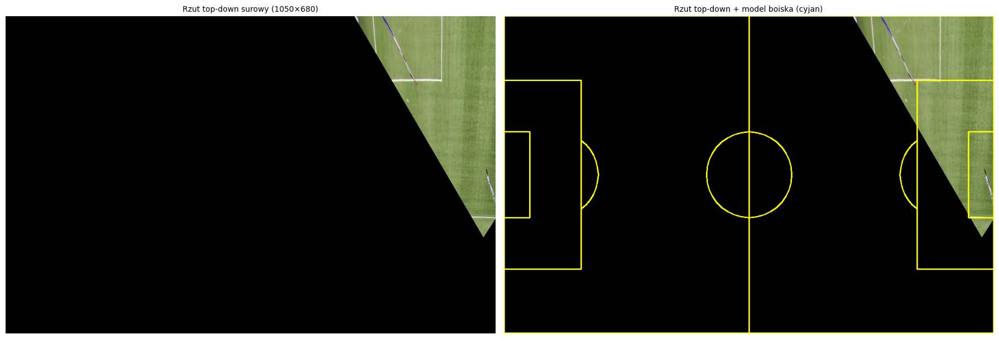

Canvas: 1050×680 px  (10 px/m)


In [145]:
if H is not None:
    SCALE = 10
    L_h = PITCH_LENGTH_M / 2   # 52.5 m
    W_h = PITCH_WIDTH_M  / 2   # 34.0 m
    W_out = int(PITCH_LENGTH_M * SCALE)   # 1050 px
    H_out = int(PITCH_WIDTH_M  * SCALE)   # 680 px

    # S: metry → piksele wyjściowe
    S = np.array([
        [SCALE,     0,  L_h * SCALE],
        [    0, SCALE,  W_h * SCALE],
        [    0,     0,            1]
    ], dtype=np.float64)

    M_td = S @ H    # obraz px → płaski canvas px
    top_down_raw = cv2.warpPerspective(img, M_td, (W_out, H_out))

    # Rysujemy model boiska bezpośrednio (metry → px wyjściowe)
    top_down = top_down_raw.copy()
    for polyline in calibrator.pitch_lines:
        pts_td = []
        for xm, ym in polyline:
            px_ = int(round((xm + L_h) * SCALE))
            py_ = int(round((ym + W_h) * SCALE))
            pts_td.append((px_, py_))
        for k in range(len(pts_td) - 1):
            p1t = (max(0, min(W_out - 1, pts_td[k][0])),
                   max(0, min(H_out - 1, pts_td[k][1])))
            p2t = (max(0, min(W_out - 1, pts_td[k + 1][0])),
                   max(0, min(H_out - 1, pts_td[k + 1][1])))
            cv2.line(top_down, p1t, p2t, (0, 255, 255), 2)

    grid(
        [top_down_raw, top_down],
        [f'Rzut top-down surowy ({W_out}×{H_out})',
         'Rzut top-down + model boiska (cyjan)'],
        cols=2, figsize=(18, 7)
    )
    print(f'Canvas: {W_out}×{H_out} px  ({SCALE} px/m)')
else:
    print('Brak H — nie można wygenerować rzutu top-down.')

## Batch — wszystkie klatki

Pełny pipeline (z próbą homografii) na wszystkich klatkach.

In [123]:
import pandas as pd
from pitch_homography_diagnostics import PitchHomographyDiagnostics, DiagnosticConfig

OUT_BATCH = ROOT / 'batch_output'
OUT_BATCH.mkdir(exist_ok=True)

cfg_b = DiagnosticConfig(
    run_circle_detection=False,
    run_original_homography_attempt=True
)
diag = PitchHomographyDiagnostics(cfg_b, verbose=True)

reports = []
for p in IMAGE_PATHS:
    r = diag.run_one(p, OUT_BATCH / p.stem)
    reports.append(r)

cols_b = [
    'image_name', 'field_area_ratio',
    'segments_filtered', 'merged_lines', 'merged_group_a', 'merged_group_b',
    'intersections', 'homography_found', 'homography_accepted',
    'homography_base_score', 'homography_mean_model_to_line_px',
    'homography_reason',
]
df = pd.DataFrame(reports)[cols_b].sort_values('homography_base_score', ascending=False)
print(df.to_string(index=False))

[diagnostics] 000001.jpg: start, size=1920x1080
[diagnostics] 000001.jpg: line_pixels=34385, segments=125, merged=14, circle=skipped_by_config, H=False
[diagnostics] 000066.jpg: start, size=1920x1080
[diagnostics] 000066.jpg: line_pixels=64513, segments=286, merged=27, circle=skipped_by_config, H=False
[diagnostics] 000069.jpg: start, size=1920x1080
[diagnostics] 000069.jpg: line_pixels=20019, segments=72, merged=9, circle=skipped_by_config, H=False
[diagnostics] 000250.jpg: start, size=1920x1080
[diagnostics] 000250.jpg: line_pixels=1415, segments=15, merged=1, circle=skipped_by_config, H=False
[diagnostics] 000300.jpg: start, size=1920x1080
[diagnostics] 000300.jpg: line_pixels=12651, segments=71, merged=4, circle=skipped_by_config, H=False
[diagnostics] 00031.jpg: start, size=960x540
[diagnostics] 00031.jpg: line_pixels=4336, segments=31, merged=7, circle=skipped_by_config, H=False
[diagnostics] 000310.jpg: start, size=1920x1080
[diagnostics] 000310.jpg: line_pixels=21349, segments=